<a href="https://colab.research.google.com/github/alina-chak/RESEARCH_PHD/blob/main/Revision_multiple_prototype_7_12_22.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import shutil
shutil.copy("/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51_R3D50_ORIG.p", "/content/HMDB51_R3D50_ORIG.p")

'/content/HMDB51_R3D50_ORIG.p'

In [3]:
import shutil
shutil.copy("/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51_R3D50_ORIG_proto_revise.p", "/content/HMDB51_R3D50_ORIG_proto_revise.p")

'/content/HMDB51_R3D50_ORIG_proto_revise.p'

In [4]:
import shutil
shutil.copy("/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51_R3D50_ORIG_QUERY.p", "/content/HMDB51_R3D50_ORIG_QUERY.p")

'/content/HMDB51_R3D50_ORIG_QUERY.p'

In [5]:
#For removing access of drive
drive.flush_and_unmount()
#For removing access of drive
#drive.flush_and_unmount()
#for permanent removal of drive directories
!rm -rf /content/drive

Streaming output truncated to the last 5000 lines.
27   24.208057         dribble
23   24.813700            pick
48   24.942314          pullup
4    24.968544             run
50   25.090454      shoot_ball
42   25.097649           situp
12   25.167858  sword_exercise
19   25.192371      fall_floor
26   25.241701      draw_sword
28   25.316799       kick_ball
30   25.337389       shoot_gun
46   25.542332             hit
2    25.554819            clap
17   25.749502    climb_stairs
8    25.790455      ride_horse
0    25.825502           catch
9    25.860651           throw
20   25.916370            wave
32   25.947136            kick
7    26.082838           sword
41   26.154350      brush_hair
11   26.159615           climb
29   26.168478           stand
3    26.337631         fencing
15   26.396225             sit
45   26.507645     shake_hands
24   26.558968           punch
49   26.639679            chew
35   26.652309       ride_bike
40   26.674643           drink
16   26.721100     

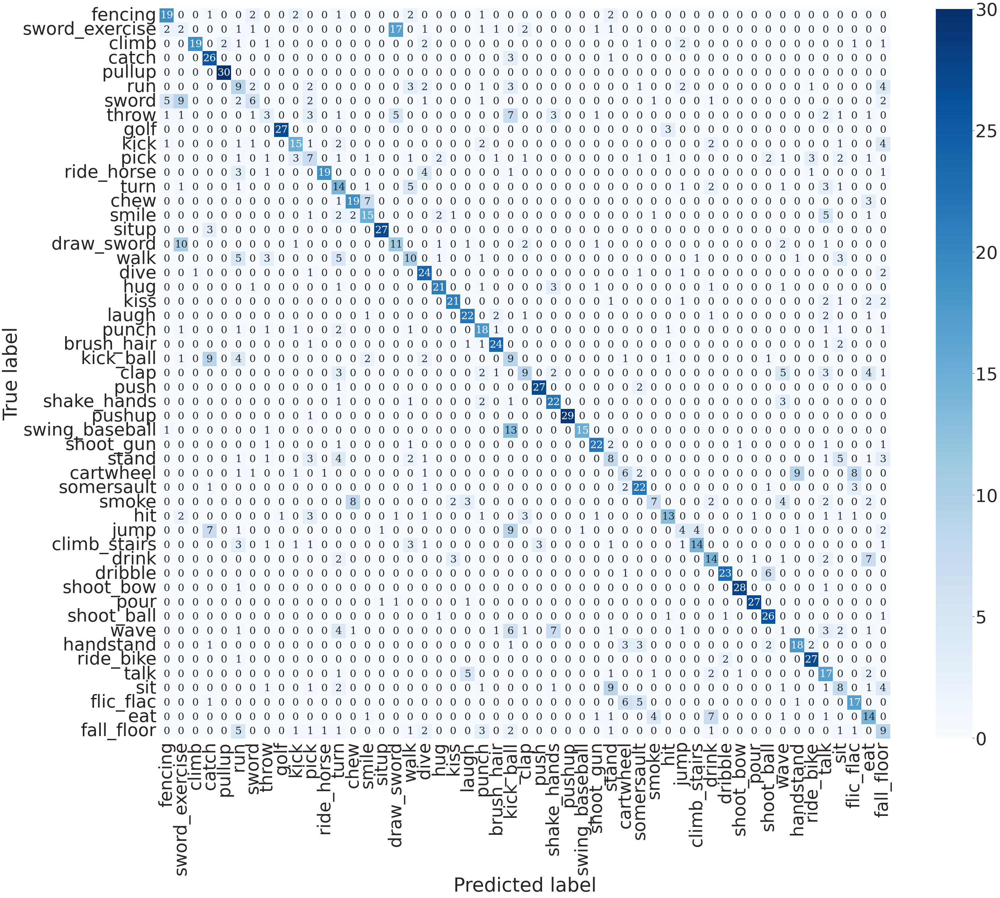

In [ ]:
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy
from sklearn.metrics.pairwise import cosine_similarity

from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cate = []

cl_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cate_whole.append(cate)
    cl = []
    cate = []
    
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cate_whole.append(cate) 

#for getting number of dataset videos
no_vid = []
ct = []
for i in range(len(cate_whole)):
  k = 0
  for j in range(len(cate_whole[i])):
    k = k + 1
  no_vid.append(k)
  ct.append(cate_whole[i][0])

unique_cate = []
num = []

for i in range(len(cate_whole)):
  unique_cate.append(cate_whole[i][0])
  num.append(i)

#filename is the category in prototype #Query set for confusion matrix calculation
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])
    #for i in range(len(unique_cate)):
    #  if unique_cate[i] == item['category']:
    #    ytest1.append(num[i])

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))



y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features']).ravel()
    a = point_a
    #point_a = point_a.ravel().reshape(1, -1)
    #a = log1.predict(point_a)
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).ravel()
        b = point_b
        #point_b = point_b.ravel().reshape(1, -1)
        #b = log1.predict(point_b)

        distance = np.linalg.norm(a - b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    for i in range(len(unique_cate)):
      if (unique_cate[i] == df1['category'].iloc[0]):
        y_pred.append(unique_cate[i])

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.

    Arguments
    ---------
    cf:            confusion matrix to be passed in

    group_names:   List of strings that represent the labels row by row to be shown in each square.

    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'

    count:         If True, show the raw number in the confusion matrix. Default is True.

    normalize:     If True, show the proportions for each category. Default is True.

    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.

    xyticks:       If True, show x and y ticks. Default is True.

    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.

    sum_stats:     If True, display summary statistics below the figure. Default is True.

    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.

    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.

    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.set(font_scale=5.0)
    sns.heatmap(cf,square=True, annot=True, cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories, annot_kws={
                'fontsize': 32,
                #'fontweight': 'bold',
                'fontfamily': 'serif'
            }, cbar_kws={'shrink': 0.82})

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label')# + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

#labels = ['True Neg','False Pos','False Neg','True Pos']
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(ytest1, y_pred, labels=unique_cate)

make_confusion_matrix(cm, figsize=(51,51), categories=unique_cate, cmap='Blues', cbar=True)

print(cm)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(ytest1, y_pred)))

print('Micro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(ytest1, y_pred, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(ytest1, y_pred, target_names=unique_cate))



In [ ]:
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))



y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features']).ravel()
    a = point_a
    #point_a = point_a.ravel().reshape(1, -1)
    #a = log1.predict(point_a)
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).ravel()
        b = point_b
        #point_b = point_b.ravel().reshape(1, -1)
        #b = log1.predict(point_b)

        distance = np.linalg.norm(a - b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)

    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
6    26.843504             eat
18   26.966497           laugh
25   27.435007             hug
44   27.596979  swing_baseball
5    27.603210            talk
21   27.720299            kiss
13   27.862551           smile
31   27.904984            pour
34   28.410292            golf
classification
flic_flac
The data  1442  is :  2048
[{'similarity': 22.950516, 'category': 'catch'}, {'similarity': 17.012383, 'category': 'flic_flac'}, {'similarity': 25.336664, 'category': 'clap'}, {'similarity': 24.102829, 'category': 'fencing'}, {'similarity': 23.09702, 'category': 'run'}, {'similarity': 26.973703, 'category': 'talk'}, {'similarity': 26.328697, 'category': 'eat'}, {'similarity': 23.582901, 'category': 'sword'}, {'similarity': 22.68955, 'category': 'ride_horse'}, {'similarity': 24.073479, 'category': 'throw'}, {'similarity': 22.352516, 'category': 'jump'}, {'similarity': 24.861254, 'category': 'climb'}, {'similarity': 23.500793, 'category': '

Showing the pickled data:
fencing
1
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise

/usr/local/lib/python3.8/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
29        28.0           stand
44        29.0  swing_baseball
7         30.0           sword
12        31.0  sword_exercise
5         32.0            talk
9         33.0           throw
47        34.0            turn
36        35.0            walk
20        36.0            wave
classification
flic_flac
The data  1442  is :  2048
[{'similarity': 12.0, 'category': 'catch'}, {'similarity': 0.0, 'category': 'flic_flac'}, {'similarity': 10.0, 'category': 'clap'}, {'similarity': 1.0, 'category': 'fencing'}, {'similarity': 18.0, 'category': 'run'}, {'similarity': 32.0, 'category': 'talk'}, {'similarity': 3.0, 'category': 'eat'}, {'similarity': 30.0, 'category': 'sword'}, {'similarity': 17.0, 'category': 'ride_horse'}, {'similarity': 33.0, 'category': 'throw'}, {'similarity': 5.0, 'category': 'jump'}, {'similarity': 9.0, 'category': 'climb'}, {'similarity': 31.0, 'category': 'sword_exercise'}, {'similarity': 25.0, 'category': 'smile'}, {'simil

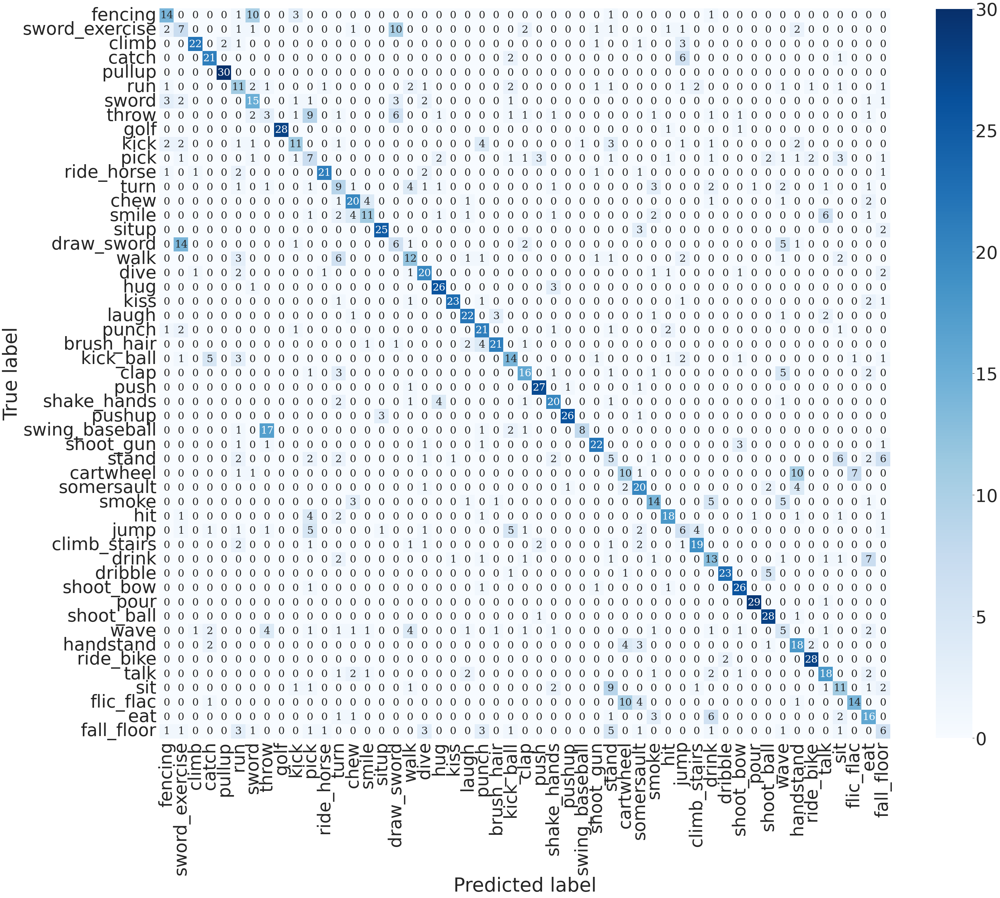

In [4]:
#MULTIPROTOTYPE LOGISTIC REGRESSION
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cate = []

cl_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cate_whole.append(cate)
    cl = []
    cate = []
    
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cate_whole.append(cate)

#clustered sampling for creating more prototypes with minimum number of samples

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



samp_cl = []
samp_cate = []

#Code to find minimum number of samples
m_c = []
for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  m_c.append(cl_whole[i].shape[0])

th = 1
N = min(m_c)
print(N)

for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  #if cl_whole[i].shape[0] != N :
  kmeans = KMeans(n_clusters=(N-th))
  kmeans.fit(cl_whole[i])
  y_kmeans = kmeans.predict(cl_whole[i])
  centers = kmeans.cluster_centers_
  for t in range(len(centers)):
    samp_cl.append(centers[t])
  for j in range(N-th):
    cat.append(cate_whole[i][0])
  
  
  samp_cate.append(cat)


  #print(centers.shape)
print(len(samp_cl))
print(len(samp_cate))

Xtrain1 = np.array(samp_cl)
Xtrain1.shape

samp_cate = list(np.concatenate(samp_cate).flat)

ytrain1 = np.array(samp_cate).ravel()
ytrain1
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train

#LOGISTIC REGRESSION TRAINING
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

log1 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=15, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

rnd = RandomForestClassifier(n_estimators=100)
svm = SVC()

log1.fit(Xtrain1, data_train)



#for getting number of dataset videos
no_vid = []
ct = []
for i in range(len(cate_whole)):
  k = 0
  for j in range(len(cate_whole[i])):
    k = k + 1
  no_vid.append(k)
  ct.append(cate_whole[i][0])

unique_cate = []
num = []

for i in range(len(cate_whole)):
  unique_cate.append(cate_whole[i][0])
  num.append(i)

#filename is the category in prototype #Query set for confusion matrix calculation
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])
    #for i in range(len(unique_cate)):
    #  if unique_cate[i] == item['category']:
    #    ytest1.append(num[i])

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))



y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = log1.predict(point_a)
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel().reshape(1, -1)
        b = log1.predict(point_b)

        distance = np.linalg.norm(a[0] - b[0])

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    for i in range(len(unique_cate)):
      if (unique_cate[i] == df1['category'].iloc[0]):
        y_pred.append(unique_cate[i])

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.

    Arguments
    ---------
    cf:            confusion matrix to be passed in

    group_names:   List of strings that represent the labels row by row to be shown in each square.

    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'

    count:         If True, show the raw number in the confusion matrix. Default is True.

    normalize:     If True, show the proportions for each category. Default is True.

    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.

    xyticks:       If True, show x and y ticks. Default is True.

    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.

    sum_stats:     If True, display summary statistics below the figure. Default is True.

    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.

    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.

    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.set(font_scale=5.0)
    sns.heatmap(cf,square=True, annot=True, cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories, annot_kws={
                'fontsize': 32,
                #'fontweight': 'bold',
                'fontfamily': 'serif'
            }, cbar_kws={'shrink': 0.82})

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label')# + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

#labels = ['True Neg','False Pos','False Neg','True Pos']
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(ytest1, y_pred, labels=unique_cate)

make_confusion_matrix(cm, figsize=(51,51), categories=unique_cate, cmap='Blues', cbar=True)

print(cm)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(ytest1, y_pred)))

print('Micro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(ytest1, y_pred, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(ytest1, y_pred, target_names=unique_cate))

#Ensemble learning experiment 
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score


import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))




file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = log1.predict(point_a)
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel().reshape(1, -1)
        b = log1.predict(point_b)

        distance = np.linalg.norm(a[0] - b[0])

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)




In [5]:
print(classification_report(ytest1, y_pred, target_names=unique_cate))

                precision    recall  f1-score   support

       fencing       0.81      0.70      0.75        30
sword_exercise       0.37      0.33      0.35        30
         climb       0.66      0.70      0.68        30
         catch       0.59      0.67      0.62        30
        pullup       0.57      0.53      0.55        30
           run       0.88      0.73      0.80        30
         sword       0.73      0.63      0.68        30
         throw       0.59      0.67      0.62        30
          golf       0.23      0.20      0.21        30
          kick       0.92      0.77      0.84        30
          pick       0.37      0.43      0.40        30
    ride_horse       0.39      0.53      0.45        30
          turn       0.22      0.20      0.21        30
          chew       0.56      0.47      0.51        30
         smile       0.64      0.47      0.54        30
         situp       1.00      0.93      0.97        30
    draw_sword       0.44      0.60      0.51  

Showing the pickled data:
fencing
1
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise

/usr/local/lib/python3.8/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
29        28.0           stand
44        29.0  swing_baseball
7         30.0           sword
12        31.0  sword_exercise
5         32.0            talk
9         33.0           throw
47        34.0            turn
36        35.0            walk
20        36.0            wave
classification
flic_flac
The data  1442  is :  2048
[{'similarity': 12.0, 'category': 'catch'}, {'similarity': 0.0, 'category': 'flic_flac'}, {'similarity': 10.0, 'category': 'clap'}, {'similarity': 1.0, 'category': 'fencing'}, {'similarity': 18.0, 'category': 'run'}, {'similarity': 32.0, 'category': 'talk'}, {'similarity': 3.0, 'category': 'eat'}, {'similarity': 30.0, 'category': 'sword'}, {'similarity': 17.0, 'category': 'ride_horse'}, {'similarity': 33.0, 'category': 'throw'}, {'similarity': 5.0, 'category': 'jump'}, {'similarity': 9.0, 'category': 'climb'}, {'similarity': 31.0, 'category': 'sword_exercise'}, {'similarity': 25.0, 'category': 'smile'}, {'simil

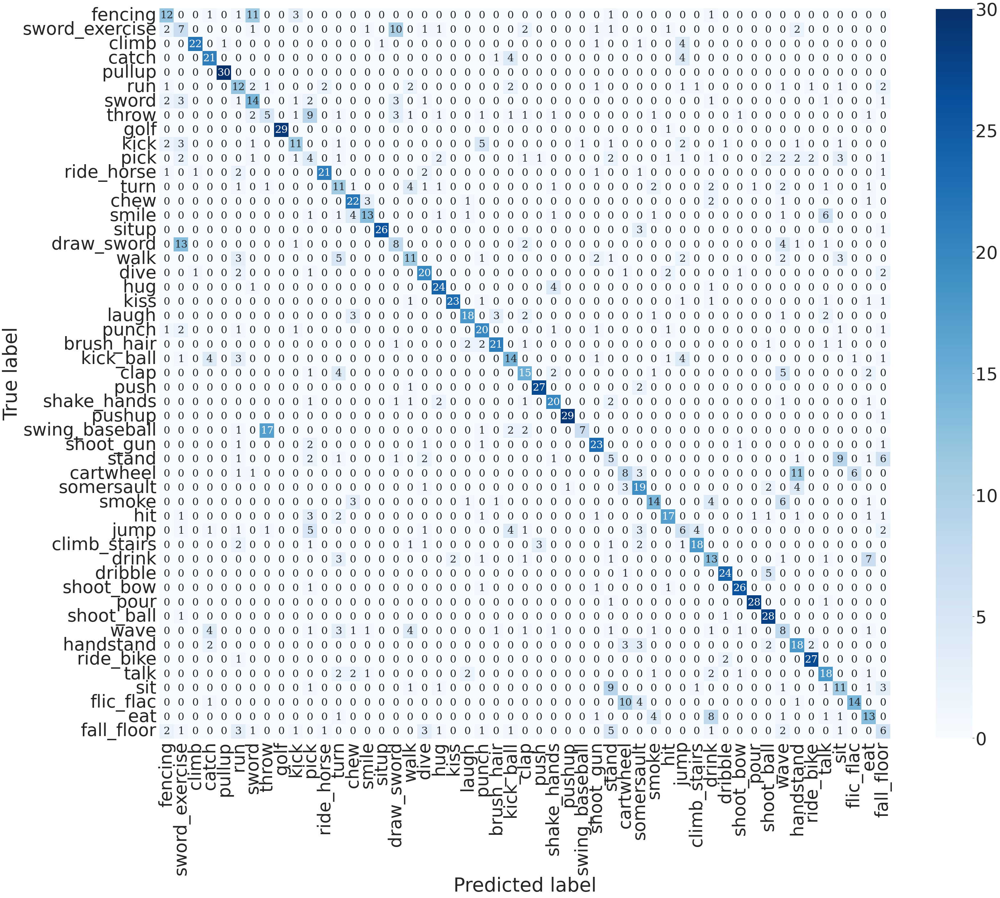

In [9]:
#MULTIPROTOTYPE LOGISTIC REGRESSION with wavelet transform features only cD component
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy
import pywt
from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cate = []

cl_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    point_a = np.array(item['features']).ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    cl.append(cD)
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    point_a = np.array(item['features']).ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    cl.append(cD)

    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cate_whole.append(cate)
    cl = []
    cate = []
    
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    point_a = np.array(item['features']).ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    cl.append(cD)

    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cate_whole.append(cate)

#clustered sampling for creating more prototypes with minimum number of samples

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



samp_cl = []
samp_cate = []

#Code to find minimum number of samples
m_c = []
for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  m_c.append(cl_whole[i].shape[0])

th = 1
N = min(m_c)
print(N)

for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  #if cl_whole[i].shape[0] != N :
  kmeans = KMeans(n_clusters=(N-th))
  kmeans.fit(cl_whole[i])
  y_kmeans = kmeans.predict(cl_whole[i])
  centers = kmeans.cluster_centers_
  for t in range(len(centers)):
    samp_cl.append(centers[t])
  for j in range(N-th):
    cat.append(cate_whole[i][0])
  
  
  samp_cate.append(cat)


  #print(centers.shape)
print(len(samp_cl))
print(len(samp_cate))

Xtrain1 = np.array(samp_cl)
Xtrain1.shape

samp_cate = list(np.concatenate(samp_cate).flat)

ytrain1 = np.array(samp_cate).ravel()
ytrain1
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train

#LOGISTIC REGRESSION TRAINING
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

log1 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=15, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

rnd = RandomForestClassifier(n_estimators=100)
svm = SVC()

log1.fit(Xtrain1, data_train)



#for getting number of dataset videos
no_vid = []
ct = []
for i in range(len(cate_whole)):
  k = 0
  for j in range(len(cate_whole[i])):
    k = k + 1
  no_vid.append(k)
  ct.append(cate_whole[i][0])

unique_cate = []
num = []

for i in range(len(cate_whole)):
  unique_cate.append(cate_whole[i][0])
  num.append(i)

#filename is the category in prototype #Query set for confusion matrix calculation
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])
    #for i in range(len(unique_cate)):
    #  if unique_cate[i] == item['category']:
    #    ytest1.append(num[i])

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))



y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    
    a = log1.predict(cD.reshape(1, -1))
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel()
        (cA, cD) = pywt.dwt(point_b, 'db1')
        b = log1.predict(cD.reshape(1, -1))

        distance = np.linalg.norm(a[0] - b[0])

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    for i in range(len(unique_cate)):
      if (unique_cate[i] == df1['category'].iloc[0]):
        y_pred.append(unique_cate[i])

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.

    Arguments
    ---------
    cf:            confusion matrix to be passed in

    group_names:   List of strings that represent the labels row by row to be shown in each square.

    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'

    count:         If True, show the raw number in the confusion matrix. Default is True.

    normalize:     If True, show the proportions for each category. Default is True.

    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.

    xyticks:       If True, show x and y ticks. Default is True.

    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.

    sum_stats:     If True, display summary statistics below the figure. Default is True.

    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.

    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.

    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.set(font_scale=5.0)
    sns.heatmap(cf,square=True, annot=True, cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories, annot_kws={
                'fontsize': 32,
                #'fontweight': 'bold',
                'fontfamily': 'serif'
            }, cbar_kws={'shrink': 0.82})

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label')# + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

#labels = ['True Neg','False Pos','False Neg','True Pos']
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(ytest1, y_pred, labels=unique_cate)

make_confusion_matrix(cm, figsize=(51,51), categories=unique_cate, cmap='Blues', cbar=True)

print(cm)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(ytest1, y_pred)))

print('Micro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(ytest1, y_pred, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(ytest1, y_pred, target_names=unique_cate))

#TOP 1 and TOP 5 Accuracy
#Ensemble learning experiment 
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score


import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))




file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    a = log1.predict(cD.reshape(1, -1))
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel()
        (cA, cD) = pywt.dwt(point_b, 'db1')
        b = log1.predict(cD.reshape(1, -1))

        distance = np.linalg.norm(a[0] - b[0])

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Showing the pickled data:
fencing
1
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise

/usr/local/lib/python3.8/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
29        28.0           stand
44        29.0  swing_baseball
7         30.0           sword
12        31.0  sword_exercise
5         32.0            talk
9         33.0           throw
47        34.0            turn
36        35.0            walk
20        36.0            wave
classification
flic_flac
The data  1442  is :  2048
[{'similarity': 12.0, 'category': 'catch'}, {'similarity': 0.0, 'category': 'flic_flac'}, {'similarity': 10.0, 'category': 'clap'}, {'similarity': 1.0, 'category': 'fencing'}, {'similarity': 18.0, 'category': 'run'}, {'similarity': 32.0, 'category': 'talk'}, {'similarity': 3.0, 'category': 'eat'}, {'similarity': 30.0, 'category': 'sword'}, {'similarity': 17.0, 'category': 'ride_horse'}, {'similarity': 33.0, 'category': 'throw'}, {'similarity': 5.0, 'category': 'jump'}, {'similarity': 9.0, 'category': 'climb'}, {'similarity': 31.000000000000004, 'category': 'sword_exercise'}, {'similarity': 25.0, 'category': 'sm

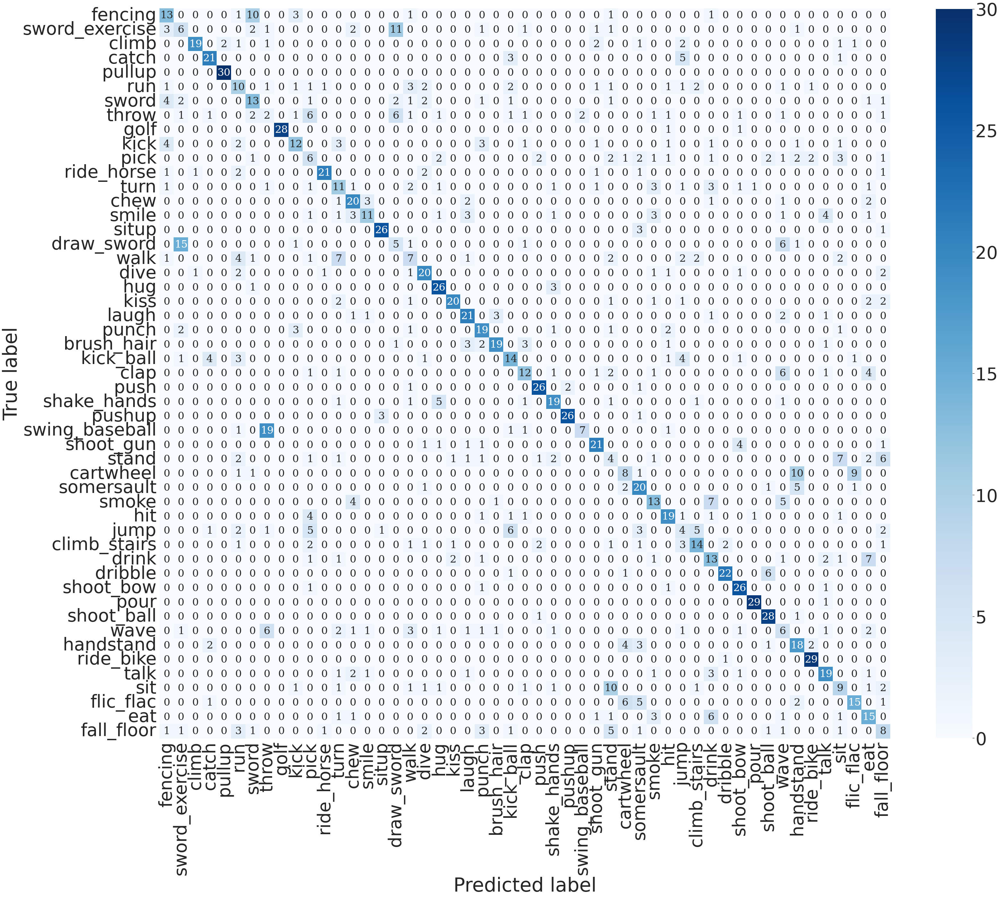

In [3]:
#MULTIPROTOTYPE LOGISTIC REGRESSION with wavelet transform features only cD component and cA component
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy
import pywt
from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cl1 = []
cate = []

cl_whole = []
cl1_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    point_a = np.array(item['features']).ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    cl.append(cD)
    cl1.append(cA)
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    point_a = np.array(item['features']).ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    cl.append(cD)
    cl1.append(cA)


    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cl1_whole.append(cl1)
    cate_whole.append(cate)
    cl = []
    cl1 = []
    cate = []

    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    point_a = np.array(item['features']).ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    cl.append(cD)
    cl1.append(cA)

    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cl1_whole.append(cl1)
cate_whole.append(cate)

#clustered sampling for creating more prototypes with minimum number of samples

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



samp_cl = []
samp_cate = []

#Code to find minimum number of samples
m_c = []
for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  m_c.append(cl_whole[i].shape[0])

th = 1
N = min(m_c)
print(N)

for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  #if cl_whole[i].shape[0] != N :
  kmeans = KMeans(n_clusters=(N-th))
  kmeans.fit(cl_whole[i])
  y_kmeans = kmeans.predict(cl_whole[i])
  centers = kmeans.cluster_centers_
  for t in range(len(centers)):
    samp_cl.append(centers[t])
  for j in range(N-th):
    cat.append(cate_whole[i][0])
  
  
  samp_cate.append(cat)

#cA clustering
samp_cl1 = []
samp_cate = []

#Code to find minimum number of samples
m_c = []
for i in range(len(cl1_whole)):
  cat = []
  cl1_whole[i] = np.array(cl1_whole[i])
  print(cl1_whole[i].shape)
  m_c.append(cl1_whole[i].shape[0])

th = 1
N = min(m_c)
print(N)

for i in range(len(cl1_whole)):
  cat = []
  cl1_whole[i] = np.array(cl1_whole[i])
  print(cl1_whole[i].shape)
  #if cl_whole[i].shape[0] != N :
  kmeans = KMeans(n_clusters=(N-th))
  kmeans.fit(cl1_whole[i])
  y_kmeans = kmeans.predict(cl1_whole[i])
  centers = kmeans.cluster_centers_
  for t in range(len(centers)):
    samp_cl1.append(centers[t])
  for j in range(N-th):
    cat.append(cate_whole[i][0])
  
  
  samp_cate.append(cat)



  #print(centers.shape)
print(len(samp_cl))
print(len(samp_cate))

Xtrain1 = np.array(samp_cl)
Xtrain1.shape

Xtrain12 = np.array(samp_cl1)
Xtrain12.shape


samp_cate = list(np.concatenate(samp_cate).flat)

ytrain1 = np.array(samp_cate).ravel()
ytrain1
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train

#LOGISTIC REGRESSION TRAINING
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

log1 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=15, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

log12 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=15, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)


rnd = RandomForestClassifier(n_estimators=100)
svm = SVC()

log1.fit(Xtrain1, data_train)
log12.fit(Xtrain12, data_train)


#for getting number of dataset videos
no_vid = []
ct = []
for i in range(len(cate_whole)):
  k = 0
  for j in range(len(cate_whole[i])):
    k = k + 1
  no_vid.append(k)
  ct.append(cate_whole[i][0])

unique_cate = []
num = []

for i in range(len(cate_whole)):
  unique_cate.append(cate_whole[i][0])
  num.append(i)

#filename is the category in prototype #Query set for confusion matrix calculation
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])
    #for i in range(len(unique_cate)):
    #  if unique_cate[i] == item['category']:
    #    ytest1.append(num[i])

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))



y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    
    a = log1.predict(cD.reshape(1, -1))
    a1 = log12.predict(cA.reshape(1, -1))
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel()
        (cA, cD) = pywt.dwt(point_b, 'db1')
        b = log1.predict(cD.reshape(1, -1))
        b1 = log12.predict(cA.reshape(1, -1))
        distance0 = np.linalg.norm(a[0] - b[0])
        distance1 = np.linalg.norm(a1[0] - b1[0])

        r = 0.1
        distance = r*distance0 + (1-r)*distance1

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    for i in range(len(unique_cate)):
      if (unique_cate[i] == df1['category'].iloc[0]):
        y_pred.append(unique_cate[i])

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.

    Arguments
    ---------
    cf:            confusion matrix to be passed in

    group_names:   List of strings that represent the labels row by row to be shown in each square.

    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'

    count:         If True, show the raw number in the confusion matrix. Default is True.

    normalize:     If True, show the proportions for each category. Default is True.

    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.

    xyticks:       If True, show x and y ticks. Default is True.

    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.

    sum_stats:     If True, display summary statistics below the figure. Default is True.

    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.

    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.

    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.set(font_scale=5.0)
    sns.heatmap(cf,square=True, annot=True, cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories, annot_kws={
                'fontsize': 32,
                #'fontweight': 'bold',
                'fontfamily': 'serif'
            }, cbar_kws={'shrink': 0.82})

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label')# + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

#labels = ['True Neg','False Pos','False Neg','True Pos']
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(ytest1, y_pred, labels=unique_cate)

make_confusion_matrix(cm, figsize=(51,51), categories=unique_cate, cmap='Blues', cbar=True)

print(cm)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(ytest1, y_pred)))

print('Micro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(ytest1, y_pred, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(ytest1, y_pred, target_names=unique_cate))

#TOP 1 and TOP 5 Accuracy
#Ensemble learning experiment 
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score


import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))




file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel()
    (cA, cD) = pywt.dwt(point_a, 'db1')
    a = log1.predict(cD.reshape(1, -1))
    a1 = log12.predict(cA.reshape(1, -1))
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel()
        (cA, cD) = pywt.dwt(point_b, 'db1')
        b = log1.predict(cD.reshape(1, -1))
        b1 = log12.predict(cA.reshape(1, -1))
        distance0 = np.linalg.norm(a[0] - b[0])
        distance1 = np.linalg.norm(a1[0] - b1[0])

        r = 0.1
        distance = r*distance0 + (1-r)*distance1

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


In [ ]:
#COSINE SIMILARITY

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))



y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features']).ravel()
    a = point_a
    a = point_a.ravel().reshape(1, -1)
    #a = log1.predict(point_a)
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).ravel()
        b = point_b
        b = point_b.ravel().reshape(1, -1)
        #b = log1.predict(point_b)

        #distance = np.linalg.norm(a - b)
        distance = cosine_similarity(a,b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    df2 = df[df['similarity'] < 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)

    dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(dff['category'].iloc[0])
    if dff['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if dff['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if dff['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if dff['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if dff['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if dff['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
18   [[0.6055721]]           laugh
49   [[0.6055652]]            chew
34   [[0.5989542]]            golf
6    [[0.5986562]]             eat
31   [[0.5977963]]            pour
25   [[0.5872442]]             hug
5    [[0.5700897]]            talk
21   [[0.5645922]]            kiss
13   [[0.5556558]]           smile
classification
flic_flac
The data  1442  is :  2048
[{'similarity': array([[0.7331082]], dtype=float32), 'category': 'catch'}, {'similarity': array([[0.8691003]], dtype=float32), 'category': 'flic_flac'}, {'similarity': array([[0.659294]], dtype=float32), 'category': 'clap'}, {'similarity': array([[0.7013234]], dtype=float32), 'category': 'fencing'}, {'similarity': array([[0.7358682]], dtype=float32), 'category': 'run'}, {'similarity': array([[0.5990143]], dtype=float32), 'category': 'talk'}, {'similarity': array([[0.62343365]], dtype=float32), 'category': 'eat'}, {'similarity': array([[0.7136731]], dtype=float32), 'category':

Streaming output truncated to the last 5000 lines.
27   [[0.7092408]]         dribble
42   [[0.6910527]]           situp
48  [[0.69096094]]          pullup
23   [[0.6906384]]            pick
4     [[0.688807]]             run
50  [[0.68539643]]      shoot_ball
19  [[0.68084276]]      fall_floor
12  [[0.67995006]]  sword_exercise
26   [[0.6776653]]      draw_sword
28  [[0.67384255]]       kick_ball
30  [[0.67354155]]       shoot_gun
46  [[0.66653717]]             hit
2    [[0.6662548]]            clap
0   [[0.66493154]]           catch
17   [[0.6637411]]    climb_stairs
9    [[0.6595933]]           throw
8    [[0.6586517]]      ride_horse
32  [[0.65468043]]            kick
20   [[0.6541749]]            wave
11  [[0.65395856]]           climb
41   [[0.6509173]]      brush_hair
7   [[0.65004826]]           sword
3    [[0.6483635]]         fencing
29   [[0.6456852]]           stand
15   [[0.6375909]]             sit
45  [[0.63620406]]     shake_hands
24  [[0.63187015]]           punch
35  

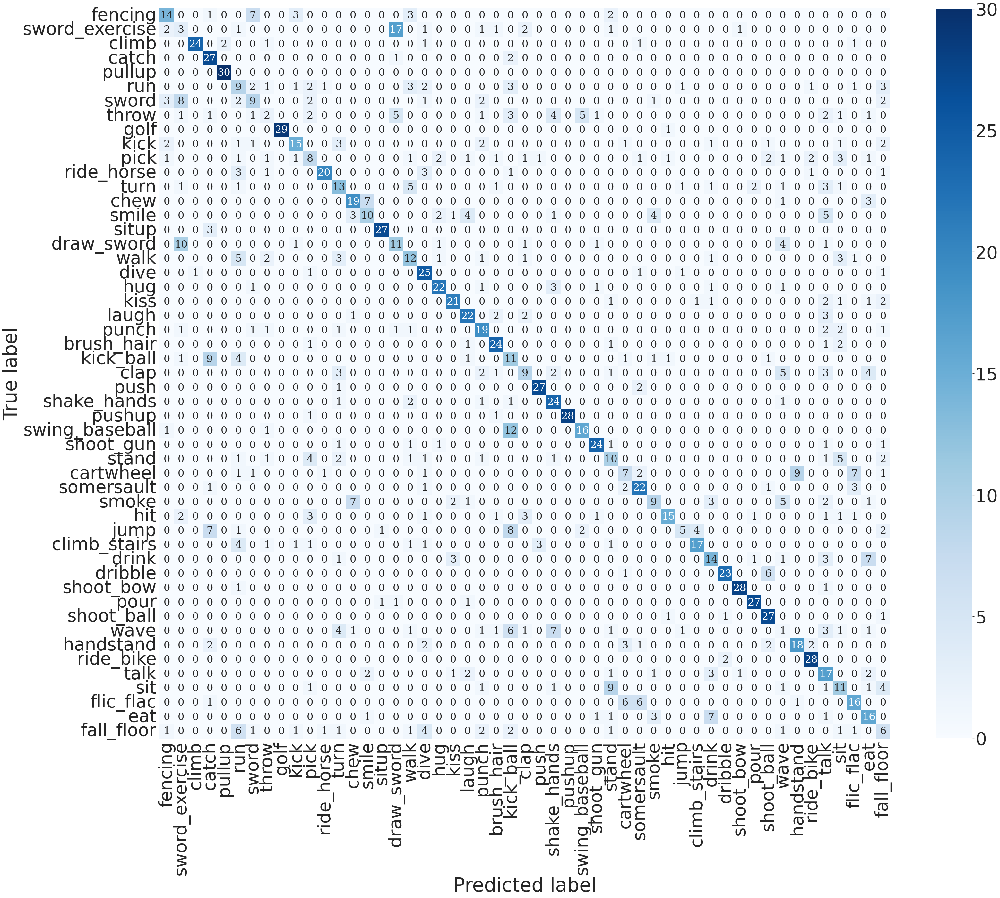

In [ ]:
#COSINE SIMILARITY
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy
from sklearn.metrics.pairwise import cosine_similarity

from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cate = []

cl_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cate_whole.append(cate)
    cl = []
    cate = []
    
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cate_whole.append(cate) 

#for getting number of dataset videos
no_vid = []
ct = []
for i in range(len(cate_whole)):
  k = 0
  for j in range(len(cate_whole[i])):
    k = k + 1
  no_vid.append(k)
  ct.append(cate_whole[i][0])

unique_cate = []
num = []

for i in range(len(cate_whole)):
  unique_cate.append(cate_whole[i][0])
  num.append(i)

#filename is the category in prototype #Query set for confusion matrix calculation
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])
    #for i in range(len(unique_cate)):
    #  if unique_cate[i] == item['category']:
    #    ytest1.append(num[i])

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))



y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features']).ravel()
    a = point_a
    a = point_a.ravel().reshape(1, -1)
    #a = log1.predict(point_a)
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).ravel()
        b = point_b
        b = point_b.ravel().reshape(1, -1)
        #b = log1.predict(point_b)

        #distance = np.linalg.norm(a - b)
        distance = cosine_similarity(a,b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    df2 = df[df['similarity'] < 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)

    dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(dff['category'].iloc[0])
    for i in range(len(unique_cate)):
      if (unique_cate[i] == dff['category'].iloc[0]):
        y_pred.append(unique_cate[i])

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.

    Arguments
    ---------
    cf:            confusion matrix to be passed in

    group_names:   List of strings that represent the labels row by row to be shown in each square.

    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'

    count:         If True, show the raw number in the confusion matrix. Default is True.

    normalize:     If True, show the proportions for each category. Default is True.

    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.

    xyticks:       If True, show x and y ticks. Default is True.

    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.

    sum_stats:     If True, display summary statistics below the figure. Default is True.

    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.

    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.

    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.set(font_scale=5.0)
    sns.heatmap(cf,square=True, annot=True, cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories, annot_kws={
                'fontsize': 32,
                #'fontweight': 'bold',
                'fontfamily': 'serif'
            }, cbar_kws={'shrink': 0.82})

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label')# + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

#labels = ['True Neg','False Pos','False Neg','True Pos']
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(ytest1, y_pred, labels=unique_cate)

make_confusion_matrix(cm, figsize=(51,51), categories=unique_cate, cmap='Blues', cbar=True)

print(cm)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(ytest1, y_pred)))

print('Micro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(ytest1, y_pred, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(ytest1, y_pred, target_names=unique_cate))



Showing the pickled data:
fencing
1
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
fencing
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise
sword_exercise

/usr/local/lib/python3.8/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
30  [[1.0000000000000002]]       shoot_gun
27  [[1.0000000000000002]]         dribble
24  [[1.0000000000000002]]           punch
23  [[1.0000000000000002]]            pick
18  [[1.0000000000000002]]           laugh
16  [[1.0000000000000002]]           smoke
50  [[1.0000000000000002]]      shoot_ball
13  [[1.0000000000000002]]           smile
12  [[1.0000000000000002]]  sword_exercise
11  [[1.0000000000000002]]           climb
28                 [[1.0]]       kick_ball
38                 [[1.0]]       shoot_bow
4                  [[1.0]]             run
5                  [[1.0]]            talk
35                 [[1.0]]       ride_bike
34                 [[1.0]]            golf
33                 [[1.0]]       cartwheel
15                 [[1.0]]             sit
31                 [[1.0]]            pour
43                 [[1.0]]      somersault
39                 [[1.0]]       handstand
40                 [[1.0]]           drink
45 

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetr

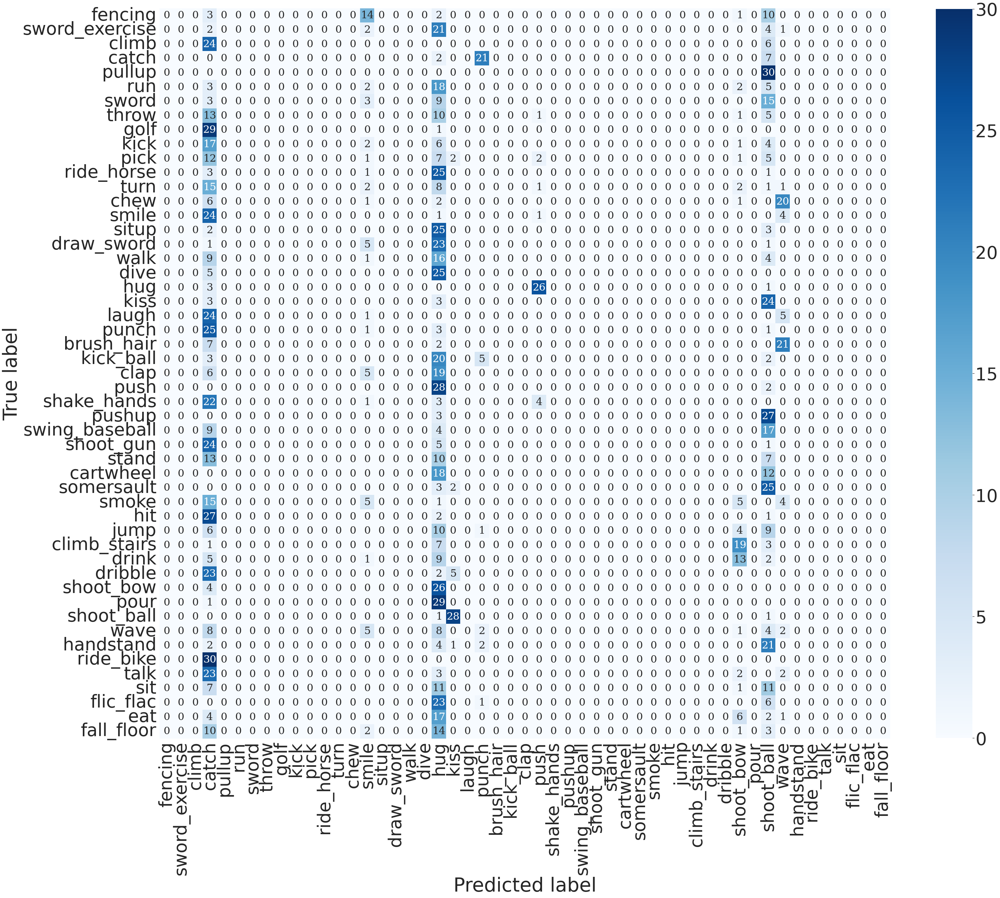

In [ ]:
#MULTIPROTOTYPE LOGISTIC REGRESSION
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cate = []

cl_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cate_whole.append(cate)
    cl = []
    cate = []
    
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cate_whole.append(cate)

#clustered sampling for creating more prototypes with minimum number of samples

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



samp_cl = []
samp_cate = []

#Code to find minimum number of samples
m_c = []
for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  m_c.append(cl_whole[i].shape[0])

th = 1
N = min(m_c)
print(N)

for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  #if cl_whole[i].shape[0] != N :
  kmeans = KMeans(n_clusters=(N-th))
  kmeans.fit(cl_whole[i])
  y_kmeans = kmeans.predict(cl_whole[i])
  centers = kmeans.cluster_centers_
  for t in range(len(centers)):
    samp_cl.append(centers[t])
  for j in range(N-th):
    cat.append(cate_whole[i][0])
  
  
  samp_cate.append(cat)


  #print(centers.shape)
print(len(samp_cl))
print(len(samp_cate))

Xtrain1 = np.array(samp_cl)
Xtrain1.shape

samp_cate = list(np.concatenate(samp_cate).flat)

ytrain1 = np.array(samp_cate).ravel()
ytrain1
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train

#LOGISTIC REGRESSION TRAINING
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

log1 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=15, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

rnd = RandomForestClassifier(n_estimators=100)
svm = SVC()

log1.fit(Xtrain1, data_train)



#for getting number of dataset videos
no_vid = []
ct = []
for i in range(len(cate_whole)):
  k = 0
  for j in range(len(cate_whole[i])):
    k = k + 1
  no_vid.append(k)
  ct.append(cate_whole[i][0])

unique_cate = []
num = []

for i in range(len(cate_whole)):
  unique_cate.append(cate_whole[i][0])
  num.append(i)

#filename is the category in prototype #Query set for confusion matrix calculation
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])
    #for i in range(len(unique_cate)):
    #  if unique_cate[i] == item['category']:
    #    ytest1.append(num[i])

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))

def int_to_binary(integer):
    binary_string = []
    while(integer > 0):
        digit = integer % 2
        binary_string.append(digit)
        integer = integer // 2
    #binary_string = binary_string[::-1]
    if len(binary_string) < 17:
      t = 16 - len(binary_string)
      for i in range(0, t):
        binary_string.append(0)
    return binary_string

y_pred = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = log1.predict(point_a)
    a1 = int_to_binary(a[0])
    
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel().reshape(1, -1)
        b = log1.predict(point_b)
        b1 = int_to_binary(b[0])
        
        distance = cosine_similarity(np.array(a1).reshape(1, -1) - np.array(b1).reshape(1, -1))

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    df2 = df[df['similarity'] < 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)

    dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(dff['category'].iloc[0])
    for i in range(len(unique_cate)):
      if (unique_cate[i] == dff['category'].iloc[0]):
        y_pred.append(unique_cate[i])

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.

    Arguments
    ---------
    cf:            confusion matrix to be passed in

    group_names:   List of strings that represent the labels row by row to be shown in each square.

    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'

    count:         If True, show the raw number in the confusion matrix. Default is True.

    normalize:     If True, show the proportions for each category. Default is True.

    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.

    xyticks:       If True, show x and y ticks. Default is True.

    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.

    sum_stats:     If True, display summary statistics below the figure. Default is True.

    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.

    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.

    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.set(font_scale=5.0)
    sns.heatmap(cf,square=True, annot=True, cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories, annot_kws={
                'fontsize': 32,
                #'fontweight': 'bold',
                'fontfamily': 'serif'
            }, cbar_kws={'shrink': 0.82})

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label')# + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

#labels = ['True Neg','False Pos','False Neg','True Pos']
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(ytest1, y_pred, labels=unique_cate)

make_confusion_matrix(cm, figsize=(51,51), categories=unique_cate, cmap='Blues', cbar=True)

print(cm)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(ytest1, y_pred)))

print('Micro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(ytest1, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(ytest1, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(ytest1, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(ytest1, y_pred, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(ytest1, y_pred, target_names=unique_cate))



In [ ]:
#Ensemble learning experiment 
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score


import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math

#model = pickle.load(open("log1.pkl", "rb"))




file = open('/content/HMDB51_R3D50_ORIG_QUERY.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category']
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = log1.predict(point_a)
    a1 = int_to_binary(a[0])
    
    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])
        point_b = point_b.ravel().reshape(1, -1)
        b = log1.predict(point_b)
        b1 = int_to_binary(b[0])
        
        distance = cosine_similarity(np.array(a1).reshape(1, -1) - np.array(b1).reshape(1, -1))

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    df2 = df[df['similarity'] < 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)

    dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(dff['category'].iloc[0])
    if dff['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if dff['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if dff['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if dff['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if dff['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if dff['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Cosine distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
7   [[0.9999999999999998]]           sword
29  [[0.9999999999999998]]           stand
8   [[0.9999999999999998]]      ride_horse
26  [[0.9999999999999998]]      draw_sword
9   [[0.9999999999999998]]           throw
22  [[0.9999999999999998]]            push
21  [[0.9999999999999998]]            kiss
0   [[0.9999999999999998]]           catch
1                  [[0.0]]       flic_flac
classification
hug
The data  1442  is :  2048
[{'similarity': array([[1.]]), 'category': 'catch'}, {'similarity': array([[0.]]), 'category': 'flic_flac'}, {'similarity': array([[1.]]), 'category': 'clap'}, {'similarity': array([[1.]]), 'category': 'fencing'}, {'similarity': array([[1.]]), 'category': 'run'}, {'similarity': array([[1.]]), 'category': 'talk'}, {'similarity': array([[1.]]), 'category': 'eat'}, {'similarity': array([[1.]]), 'category': 'sword'}, {'similarity': array([[1.]]), 'category': 'ride_horse'}, {'similarity': array([[1.]]), 'category': 

In [ ]:
def int_to_binary(integer):
    binary_string = []
    while(integer > 0):
        digit = integer % 2
        binary_string.append(digit)
        integer = integer // 2
    #binary_string = binary_string[::-1]
    if len(binary_string) < 17:
      t = 16 - len(binary_string)
      for i in range(0, t):
        binary_string.append(0)
    return binary_string

int_to_binary(12)